In [1]:
import cv2
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 
import warnings
import os

In [2]:
import tensorflow as tf
from PIL import Image
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from skimage.io import imread

In [3]:
img = plt.imread('../../../data/pizza/033.jpg')
dims = np.shape(img)
dims

(619, 1100, 3)

In [4]:
matrix = np.reshape(img , (dims[0] * dims[1] , dims[2]))
print(np.shape(matrix))

(680900, 3)


Image Shape:- (619, 1100)
Color Channels:- 3
Min Color Depth : 0, Max Color Depth 255


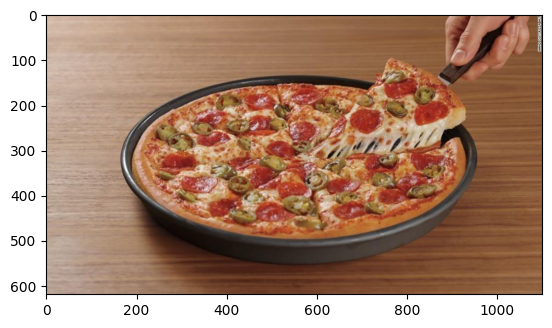

In [5]:
plt.imshow(img)
print("Image Shape:-" , dims[:2])
print("Color Channels:-", dims[2])
print("Min Color Depth : {}, Max Color Depth {}".format(np.min(img) , np.max(img)))

In [6]:
# sns.histplot(matrix[:, 0], bins=20, color="red", alpha=0.3, kde=True)
# sns.histplot(matrix[:, 1], bins=20, color="green", alpha=0.35, kde=True)
# sns.histplot(matrix[:, 2], bins=20, color="blue", alpha=0.2, kde=True)

# plt.show()


In [7]:
# _ = plt.hist2d(matrix[:,1] , matrix[:,2] , bins = (50,50))
# plt.xlabel("Green Channel")
# plt.ylabel("Blue Channel")
# plt.show()

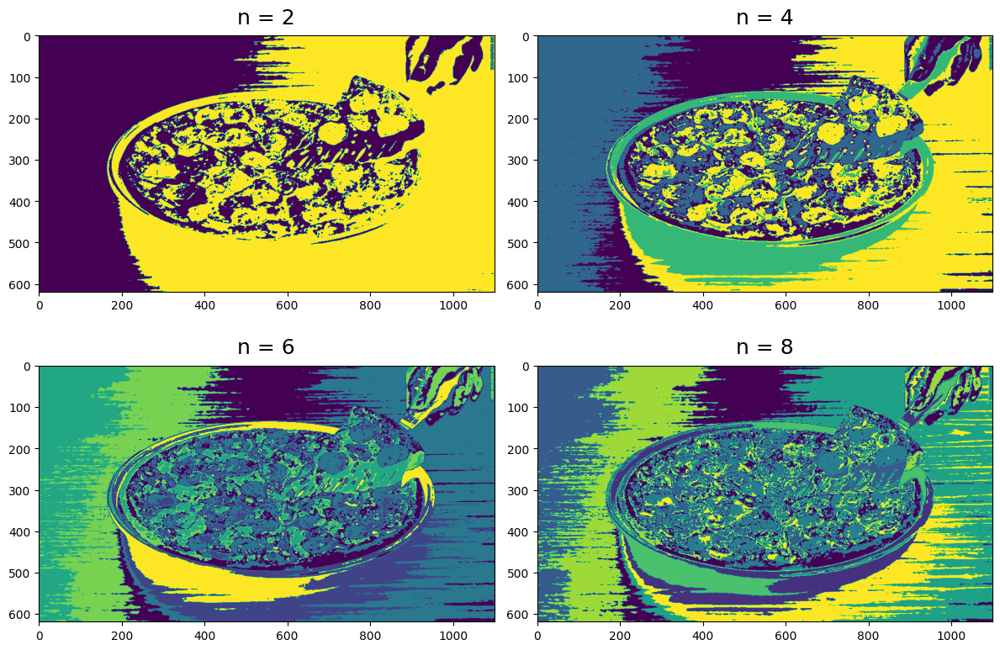

In [8]:
from sklearn import cluster
n_vals = [2,4,6,8]
plt.figure(1 , figsize = (12 , 8))

for subplot , n in enumerate(n_vals):
    kmeans = cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    dims = np.shape(img)
    clustered_img = np.reshape(clustered , (dims[0] , dims[1]))
    plt.subplot(2,2, subplot+1)
    plt.title("n = {}".format(n) , pad = 10 , size = 18)
    plt.imshow(clustered_img)

plt.tight_layout()

In [9]:
#completed the data visualization for model training 


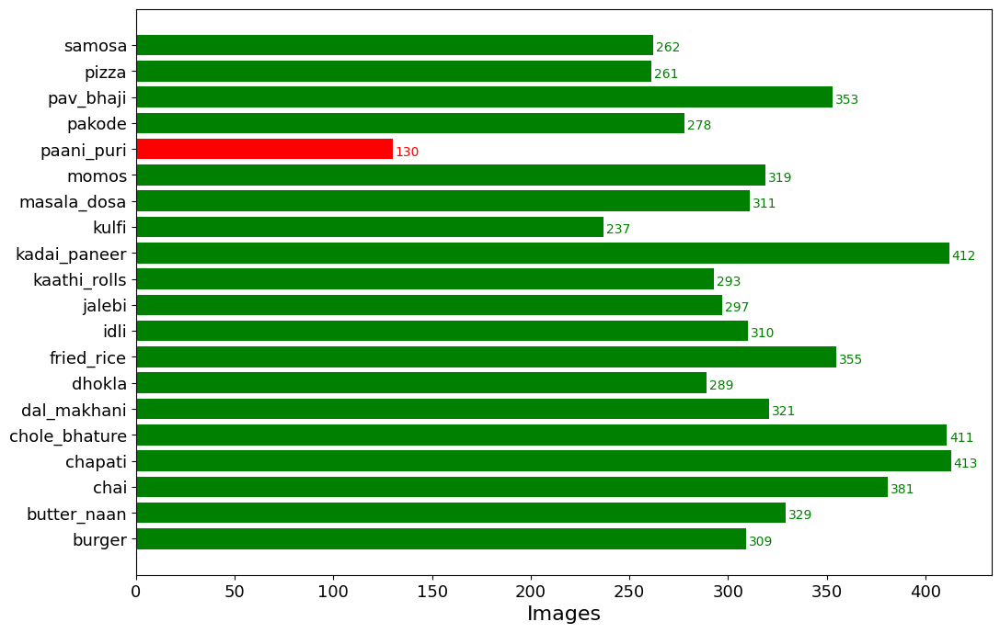

In [10]:
train = '../../../data'

data = dict()

for i in os.listdir(train):
    sub_dir = os.path.join(train , i)
    count = len(os.listdir(sub_dir))
    data[i] = count

keys = data.keys()
values = data.values()

colors = ["red" if x<= 150 else "green" for x in values]

fig , ax = plt.subplots(figsize = (12,8))
y_pos = np.arange(len(values))
plt.barh(y_pos , values , align = "center" , color=colors)
for i , v in enumerate(values):
    ax.text(v+1.4 , i-0.25 , str(v), color = colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()  


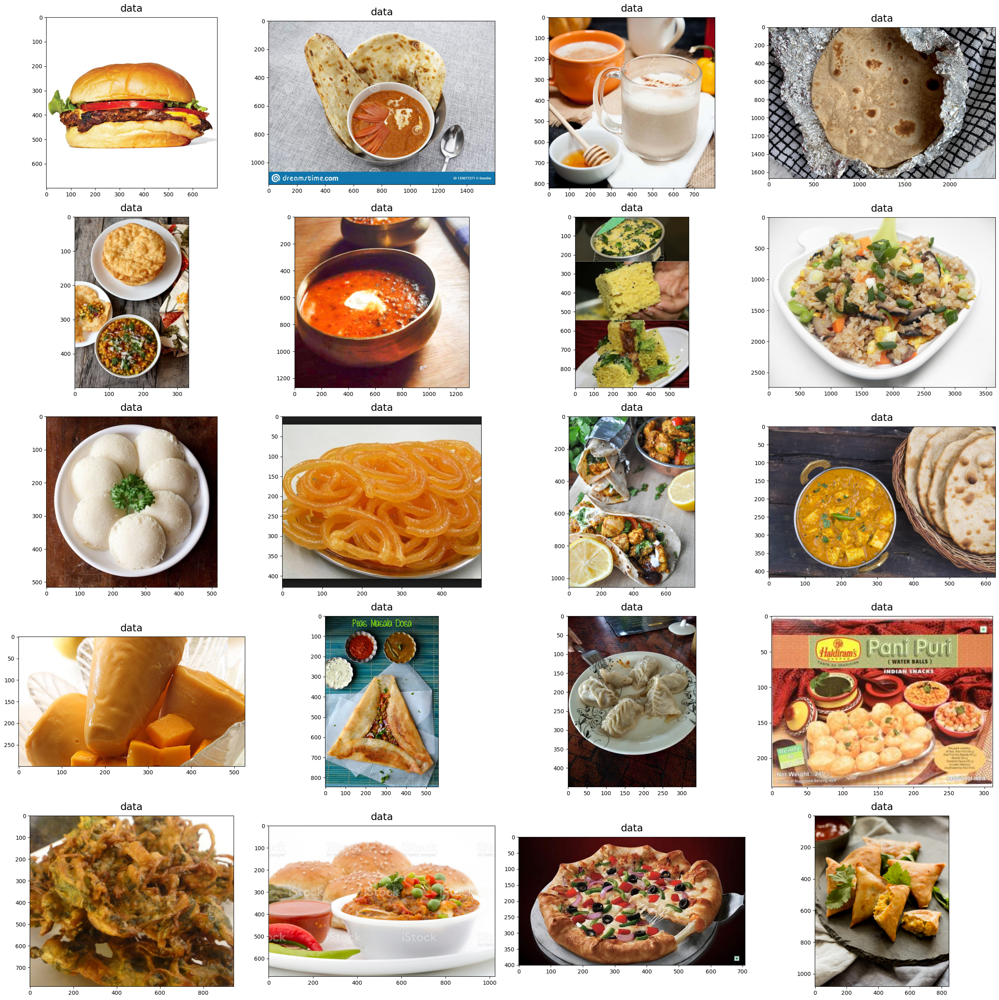

In [11]:
import random

train_folder = "../../../data/"
images = []

for food_folder in sorted(os.listdir(train_folder)):
    food_items = os.listdir(train_folder + "/" + food_folder)
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(train_folder , food_folder , food_selected))
    
    
fig = plt.figure(1 , figsize = (25,25))
for subplot , image_ in enumerate(images):
    category = image_.split("/")[-2]
    imgs = plt.imread(image_)
    a ,b, c = imgs.shape
    fig = plt.subplot(5 , 4 , subplot+1)
    fig.set_title(category , pad = 10 , size = 18)
    plt.imshow(imgs)
    
plt.tight_layout()

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

n_classes = 20
batch_size = 32
img_width , img_height = 299 , 299

train_data_dir = '../../../data/'

# Data Augmentation
train_datagen = ImageDataGenerator(rescale = 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True)


val_data_dir = '../../../data/'
val_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')


val_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 6269 images belonging to 20 classes.
Found 6269 images belonging to 20 classes.


In [13]:
class_map = train_generator.class_indices
class_map

{'burger': 0,
 'butter_naan': 1,
 'chai': 2,
 'chapati': 3,
 'chole_bhature': 4,
 'dal_makhani': 5,
 'dhokla': 6,
 'fried_rice': 7,
 'idli': 8,
 'jalebi': 9,
 'kaathi_rolls': 10,
 'kadai_paneer': 11,
 'kulfi': 12,
 'masala_dosa': 13,
 'momos': 14,
 'paani_puri': 15,
 'pakode': 16,
 'pav_bhaji': 17,
 'pizza': 18,
 'samosa': 19}

In [14]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

nb_train_samples = 3583
nb_valid_samples = 1089
image_size = [299, 299]
n_classes = 20  # Update with the actual number of classes
batch_size = 32  # Define the batch size

inception = InceptionV3(input_shape=image_size + [3], weights="imagenet", include_top=False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.2)(x)

predictions = Dense(n_classes, kernel_regularizer=l2(0.005), activation="softmax")(x)

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss="categorical_crossentropy", metrics=["accuracy"])

# Use ".keras" as the extension for ModelCheckpoint
checkpoints = ModelCheckpoint(filepath="v1_inceptionV3.keras", verbose=1, save_best_only=True)
csv_logger = CSVLogger("history_v1_inceptionV3.log")

history = model.fit(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    validation_data=val_generator,
    validation_steps=nb_valid_samples // batch_size,
    epochs=20,
    verbose=1,
    callbacks=[csv_logger, checkpoints]
)


c:\Users\isatyamks\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
  5/111 ━━━━━━━━━━━━━━━━━━━━ 47:41 27s/step - accuracy: 0.0338 - loss: 3.2131

KeyboardInterrupt: 